In [2]:
import skimage.draw
from scipy import fftpack, misc

import numpy as np
import matplotlib.pyplot as plt

import os, glob
import numpy as np
import skimage.util
import skimage
import skimage.io
import skimage.transform
import skimage.color
from skimage.registration import phase_cross_correlation

import scipy
import scipy.ndimage as ndi
from PIL import Image, ImageDraw, ImageFilter

import cv2



In [3]:

'''
    Projective transform allows to stretch the images taken at a tilt to "zero-tilt configuration"
    the transformation matrix is calculated by 
    1) defining a grid of points on flat surface (source - src),
    2) calculating the coordinates of these points on the tilted surface (destination - dst)
    3) and calculating the matrix that tranforms src to dst
'''



def projective_transform_from_matrix(image):
    """ TEST FUNCTION """
    matrix = np.array([[1, -0.5, 100],
                       [0.1, 0.9, 50],
                       [0.0015, 0.0015, 1]])
    ''' create transformation
        transform.ProjectiveTransform(matrix=matrix) A homography, also called projective transformation, preserves lines but not necessarily parallelism.
        transform.AffineTransform(shear=np.pi/6) An affine transformation preserves lines (hence the alignment of objects), as well as parallelism between lines
        transform.SimilarityTransform(scale=0.5, rotation=np.pi/12, translation=(100, 50)) A similarity transformation preserves the shape of objects. It combines scaling, translation and rotation.
        transform.EuclideanTransform(rotation=np.pi / 12.,translation = (100, -20)) preserves the Euclidean distance between pairs of points. It can be described as a rotation about the origin followed by a translation
    '''
    tform = skimage.transform.ProjectiveTransform(matrix=matrix)
    print(tform)
    tilted_image = skimage.transform.warp(image, tform.inverse)

    fig = plt.figure(figsize=(8, 3))
    ax1 = plt.subplot(1, 2, 1)
    ax2 = plt.subplot(1, 2, 2, sharex=ax1, sharey=ax1)
    ax1.imshow(image, cmap='gray')
    ax1.set_axis_off()
    ax1.set_title('Reference image')
    ax2.imshow(tilted_image, cmap='gray')
    ax2.set_axis_off()
    ax2.set_title('transformed image')


def projective_transform_from_points(points_src, points_dst, image, inverse=True):
    src = np.array(points_src)
    dst = np.array(points_dst)

    src = np.flip(src, axis=1)
    dst = np.flip(dst, axis=1)

    tform = skimage.transform.ProjectiveTransform()
    tform.estimate(src, dst)
    if inverse:
        tform = tform.inverse
    print(tform)

    warped_image = np.array( skimage.transform.warp(image, tform) )

    return warped_image


def project_3d_point_to_xy(points):
    points_2d = np.zeros((points.shape[0], points.shape[1] - 1))
    points_2d = [[point[0], point[1]] for point in points]
    points_2d = np.array(points_2d)
    return points_2d


def rotate_about_x(points, angle, image):
    shape = image.shape
    angle = np.deg2rad(angle)
    matrix = np.array([
        [np.cos(angle), 0, np.sin(angle)],
        [0, 1, 0],
        [-np.sin(angle), 0, np.cos(angle)]
    ])
    points = np.array(points)
    centre = np.asarray(shape) / 2
    print(f'centre = {centre}')
    points = points - centre
    points_rot = np.zeros((points.shape[0], points.shape[1] + 1))
    points_rot = [[point[0], point[1], 0] for point in points]
    points_rot = [np.dot(matrix, point) for point in points_rot]
    points_rot = np.array(points_rot)

    points_rot = project_3d_point_to_xy(points_rot)
    points_rot += centre

    return points_rot



In [4]:
"""
    Image processing functions
    normalisation
    band_mask for Fourier flitering (edge smoothing to reduce Fourier "ringing")
    rectangular mask for edges smoothing to reduce "ringing"
    
"""



def normalise(img):
    img_normalised = (img - np.mean(img)) / np.std(img)
    return img_normalised


def bandpass_mask(size=(512,768), low_pass=256, high_pass=10, sigma=5):
    centre = ((np.asarray(size) / 2)).astype(int)
    rr,cc = skimage.draw.ellipse(r=centre[0], c=centre[1],
                                   r_radius=low_pass,
                                   c_radius=low_pass,
                                   shape=size,
                                   rotation=0.0)
    circle_large = np.zeros(size)
    circle_large[rr,cc] = 1

    if high_pass>=low_pass: high_pass=0
    rr,cc = skimage.draw.ellipse(r=centre[0], c=centre[1],
                                   r_radius=high_pass,
                                   c_radius=high_pass,
                                   shape=size,
                                   rotation=0.0)
    circle_small = np.zeros(size)
    circle_small[rr,cc] = 1

    bandpass = circle_large - circle_small
    if sigma > 0:
        #bandpass = ndi.filters.gaussian_filter(bandpass, sigma=sigma)
        bandpass = scipy.ndimage.gaussian_filter(bandpass, sigma=sigma)

    return bandpass


def rectangular_mask(size=(128, 128), sigma=None):
    # leave at least a 5% gap on each edge
    start = np.round(np.array(size) * 0.05)
    extent = np.round(np.array(size) * 0.90)
    rr, cc = skimage.draw.rectangle(start, extent=extent, shape=size)
    mask = np.zeros(size)
    mask[rr.astype(int), cc.astype(int)] = 1.0
    if sigma:
        mask = ndi.gaussian_filter(mask, sigma=sigma)
    return mask


def filter_image_in_fourier_space(image, low_pass, high_pass, sigma,
                                  rect_mask=None, plot=False, title=''):
    if rect_mask:
        image = image * rect_mask
    bandpass = bandpass_mask(size=image.shape, low_pass=low_pass, high_pass=high_pass, sigma=sigma)
    img_ft = fftpack.fftshift(fftpack.fft2(image))
    img_ft_filtered = img_ft * bandpass
    img_filtered = np.abs(
        (fftpack.ifft2(img_ft_filtered))
    )
    if plot:
        fig = plt.figure(figsize=(16, 12))
        fig.suptitle(title, fontsize=16)
        ax1 = plt.subplot(2, 2, 1)
        ax2 = plt.subplot(2, 2, 2, sharex=ax1, sharey=ax1)
        ax3 = plt.subplot(2, 2, 3)
        ax4 = plt.subplot(2, 2, 4, sharex=ax3, sharey=ax3)
        #
        ax1.imshow(image, cmap='gray')
        ax1.set_axis_off()
        ax1.set_title('original image')
        #
        ax2.imshow(img_filtered, cmap='gray')
        ax2.set_axis_off()
        ax2.set_title(f'filtered image {low_pass},{high_pass},{sigma}')
        #
        ax3.imshow(np.log( np.abs(img_ft) ), cmap='jet')
        ax3.set_axis_off()
        ax3.set_title(f'Fourier transform')
        #
        ax4.imshow(bandpass * np.log( np.abs(img_ft) ), cmap='jet')
        ax4.set_axis_off()
        ax4.set_title(f'bandpass')

    return img_filtered, img_ft, bandpass



def crosscorrelation(img1, img2, filter='no', *args, **kwargs):
    if img1.shape != img2.shape:
        print('### ERROR in xcorr2: img1 and img2 do not have the same size ###')
        return -1
    if img1.dtype != 'float64':
        img1 = np.array(img1, float)
    if img2.dtype != 'float64':
        img2 = np.array(img2, float)

    if filter == 'yes':
        low_pass = kwargs.get('low_pass', None)
        high_pass = kwargs.get('high_pass', None)
        sigma = kwargs.get('sigma', None)
        if low_pass == 'None' or high_pass == 'None' or sigma == 'None':
            print('ERROR in xcorr: check bandpass parameters')
            return

        bandpass = bandpass_mask(size=img1.shape,
                                 low_pass=low_pass,
                                 high_pass=high_pass,
                                 sigma=sigma)
        img1ft = fftpack.ifftshift(bandpass * fftpack.fftshift(fftpack.fft2(img1)))
        s = img1.shape[0] * img1.shape[1]
        tmp = img1ft * np.conj(img1ft)
        img1ft = s * img1ft / np.sqrt(tmp.sum())
        img2ft = fftpack.ifftshift(bandpass * fftpack.fftshift(fftpack.fft2(img2)))
        img2ft[0, 0] = 0
        tmp = img2ft * np.conj(img2ft)
        img2ft = s * img2ft / np.sqrt(tmp.sum())
        xcorr = np.real(fftpack.fftshift(fftpack.ifft2(img1ft * np.conj(img2ft))))
    elif filter == 'no':
        img1ft = fftpack.fft2(img1)
        img2ft = np.conj(fftpack.fft2(img2))
        img1ft[0, 0] = 0
        xcorr = np.abs(fftpack.fftshift(fftpack.ifft2(img1ft * img2ft)))
    else:
        print('ERROR in xcorr: filter value ( filter= ' + str(filter) + ' ) not recognised')
        return -1
    return xcorr



def shift_from_crosscorrelation_simple_images(ref_image, offset_image,
                                              filter='yes',
                                              low_pass=256, high_pass=22, sigma=3):
    try:
        ref_image = ref_image.data
        offset_image = offset_image.date
    except:
        ref_image = ref_image
        offset_image = offset_image
    ref_image_norm    = normalise(ref_image)
    offset_image_norm = normalise(offset_image)
    xcorr = crosscorrelation(ref_image_norm, offset_image_norm,
                             filter=filter,
                             low_pass=low_pass,
                             high_pass=high_pass,
                             sigma=sigma)
    maxX, maxY = np.unravel_index(np.argmax(xcorr), xcorr.shape)
    cen = np.asarray(xcorr.shape) / 2
    shift = -1 * np.array(cen - [maxX, maxY], int)
    print("Shift between 1 and 2 is = " + str(shift))
    return shift


def pixel_shift_from_phase_cross_correlation(ref_image, offset_image):
    # pixel precision
    try:
        ref_image = ref_image.data
        offset_image = offset_image.data
    except:
        ref_image = ref_image
        offset_image = offset_image

    shift, error, diffphase = phase_cross_correlation(ref_image, offset_image)
    image_product = np.fft.fft2(ref_image) * np.fft.fft2(offset_image).conj()
    cc_image = np.fft.fftshift(np.fft.ifft2(image_product))
    cc_image = cc_image.real
    print(f'Detected pixel offset (y, x): {shift}')
    return shift


def subpixel_shift_from_crosscorrelation(ref_image, offset_image, upsample_factor=100):
    # subpixel precision
    try:
        ref_image = ref_image.data
        offset_image = offset_image.date
    except:
        ref_image = ref_image
        offset_image = offset_image

    shift, error, diffphase = phase_cross_correlation(ref_image, offset_image,
                                                      upsample_factor=upsample_factor)
    print(f'Detected subpixel offset (y, x): {shift}')

    return shift


def correct_image_by_shift(image,
                           shift : list):
    try:
        image = image.data
    except:
        image = image
    aligned = scipy.ndimage.shift(image, shift,
                                  output=None, order=3, mode='constant', cval=0.0, prefilter=True)
    return aligned



def load_image(file_path):
    image = Image.open(file_path)
    image = np.array(image, dtype=np.float64)
    return image


In [5]:
'''
    Alignment of the shifted images with respect to a reference image
    cross-correlation using rectangular mask to soften the sharp image edges
    Fourier filter lowpass and highpass to remove high frequency noise 
    and central high peak equal to the average of image intensity - carrying no relevant feature information
    cross-correlation provides high level of control over the procedure
    
    phase correlation - "black box" function in skimage
    
    subpixel precision correlation - "black box" function in skimage with upsampling
    
    phase correlation and subpixel correlation often fail to align the images
'''


def test_alignment_from_crosscorrelation(ref_image, offset_image, type='phase_subpixel',
                                         filter='yes', low_pass = 128, high_pass=5, sigma=3,
                                         rect_mask=None,
                                         plot=False, title=''):
    rect_mask = np.array(rect_mask)
    if rect_mask.any():
        pass
    else:
        rect_mask = 1

    if type=='crosscorrelation':
        shift = shift_from_crosscorrelation_simple_images(ref_image=ref_image * rect_mask,
                                                          offset_image=offset_image * rect_mask,
                                                          filter=filter,
                                                          low_pass=low_pass, high_pass=high_pass, sigma=sigma)
    elif type=='phase':
        shift = pixel_shift_from_phase_cross_correlation(ref_image=ref_image * rect_mask,
                                                         offset_image=offset_image * rect_mask)
    elif type=='phase_subpixel':
        shift = subpixel_shift_from_crosscorrelation(ref_image=ref_image * rect_mask,
                                                     offset_image=offset_image * rect_mask,
                                                     upsample_factor=100)
    else:
        shift = shift_from_crosscorrelation_simple_images(ref_image=ref_image * rect_mask,
                                                                      offset_image=offset_image * rect_mask,
                                                                      filter=filter,
                                                                      low_pass=low_pass, high_pass=high_pass,
                                                                      sigma=sigma)

    aligned = correct_image_by_shift(offset_image, shift=shift)


    if plot:
        fig = plt.figure(figsize=(16, 6))
        #fig.suptitle(title + f" lowpass {low_pass}, highpass {high_pass}, sigma {sigma};"
        #             f" shift={shift}", fontsize=14)
        fig.suptitle(title + f" shift={shift}", fontsize=14)        
        ax1 = plt.subplot(1, 3, 1)
        ax2 = plt.subplot(1, 3, 2, sharex=ax1, sharey=ax1)
        ax3 = plt.subplot(1, 3, 3, sharex=ax2, sharey=ax2)

        ax1.imshow(ref_image, cmap='gray')
        ax1.set_axis_off()
        ax1.set_title('previous image ref')

        ax2.imshow(ref_image, cmap='Blues_r', alpha=1)
        ax2.imshow(offset_image, cmap='Oranges_r', alpha=0.5)
        ax2.set_axis_off()
        ax2.set_title('next image overlayed with previous')

        ax3.imshow(ref_image, cmap='Blues_r', alpha=1)
        ax3.imshow(aligned, cmap='Oranges_r', alpha=0.5)
        ax3.set_axis_off()
        ax3.set_title("aligned overlayed")

    return shift, aligned

In [6]:
"""
    Load images taken at different tilt angles
"""

data_dir = r'C:\Users\sergeyg\Github\DATA.2022.10.11.ecci_Fe_fcc\for_alignment'

files = {'0a' : '01_20kV_0.4nA_WD4.4_100kx_0tilt.tif',
         '0b' : '01_20kV_0.4nA_WD4.4_100kx_0tilt_001.tif',
         '-1': '01_20kV_0.4nA_WD4.4_100kx_-1tilt.tif',
         '-2': '01_20kV_0.4nA_WD4.1_100kx_-2tilt.tif'}

tilt_0      = load_image( os.path.join(data_dir, files['0a']) )
tilt_minus1 = load_image( os.path.join(data_dir, files['-1']) )
tilt_minus2 = load_image( os.path.join(data_dir, files['-2']) )

tilt_0 = tilt_0[0:1024, :]
tilt_minus1 = tilt_minus1[0:1024, :]
tilt_minus2 = tilt_minus2[0:1024, :]

rect_mask = rectangular_mask(size=tilt_0.shape, sigma=20)

centre = [512. 768.]
<ProjectiveTransform(matrix=
    [[ 1.00000000e+00, -7.33439709e-16,  5.68434189e-13],
     [-3.53812791e-17,  9.99847695e-01,  7.79800799e-02],
     [-5.33693212e-20, -9.54999621e-19,  1.00000000e+00]])>
centre = [512. 768.]
<ProjectiveTransform(matrix=
    [[ 1.00000000e+00,  1.54404960e-16,  4.54747351e-13],
     [-6.71641079e-17,  9.99390827e-01,  3.11896566e-01],
     [-1.33426423e-19,  2.01048126e-19,  1.00000000e+00]])>


Text(0.5, 1.0, 'flat+untilted overlayed')

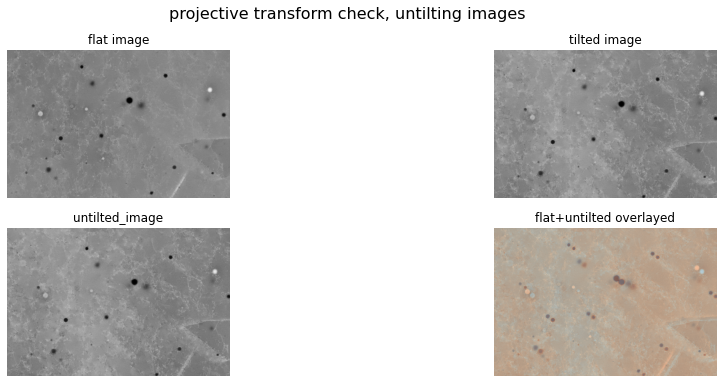

In [7]:
''' 
    Untilt transformation of the tilted images for alignment with the flat image
'''

shape = tilt_0.shape
xmin = 0
xmax = shape[0]
ymin = 0
ymax = shape[1]

X, Y = np.mgrid[xmin:xmax:17j, ymin:ymax:25j]
src = np.vstack([X.ravel(), Y.ravel()])
xx = X.ravel()
yy = Y.ravel()

src = [[i, j] for i, j in zip(xx, yy)]
src = np.array(src)

dst = rotate_about_x(points=src,
                     angle=-1,
                     image=tilt_0) # reference image, image.shape

tilt_minus1_untilted = projective_transform_from_points(points_src=src,
                                                        points_dst=dst,
                                                        image = tilt_minus1,
                                                        inverse=False)

dst = rotate_about_x(points=src,
                     angle=-2,
                     image=tilt_0)

tilt_minus2_untilted = projective_transform_from_points(points_src=src,
                                                        points_dst=dst,
                                                        image=tilt_minus2,
                                                        inverse=False)

fig = plt.figure(figsize=(16, 6))
fig.suptitle("projective transform check, untilting images", fontsize=16)
ax1 = plt.subplot(2, 2, 1)
ax2 = plt.subplot(2, 2, 2, sharex=ax1, sharey=ax1)
ax3 = plt.subplot(2, 2, 3, sharex=ax2, sharey=ax2)
ax4 = plt.subplot(2, 2, 4, sharex=ax3, sharey=ax3)

ax1.imshow(tilt_0, cmap='gray')
# [ax1.scatter(point[1], point[0], c='r') for point in src]
ax1.set_axis_off()
ax1.set_title('flat image')
#
ax2.imshow(tilt_minus1, cmap='gray')
# [ax2.scatter(point[1], point[0], c='b') for point in dst]
ax2.set_axis_off()
ax2.set_title('tilted image')
#
ax3.imshow(tilt_minus1_untilted, cmap='gray')
ax3.set_axis_off()
ax3.set_title("untilted_image")
#
ax4.imshow(tilt_0, cmap='Blues_r', alpha=1)
ax4.imshow(tilt_minus1_untilted, cmap='Oranges_r', alpha=0.5)
ax4.set_axis_off()
ax4.set_title("flat+untilted overlayed")

lowpass = 256, highpass = 24, sigma = 6
Shift between 1 and 2 is = [-25 -35]
Shift between 1 and 2 is = [-3 -2]
Detected subpixel offset (y, x): [-25.24 -34.87]


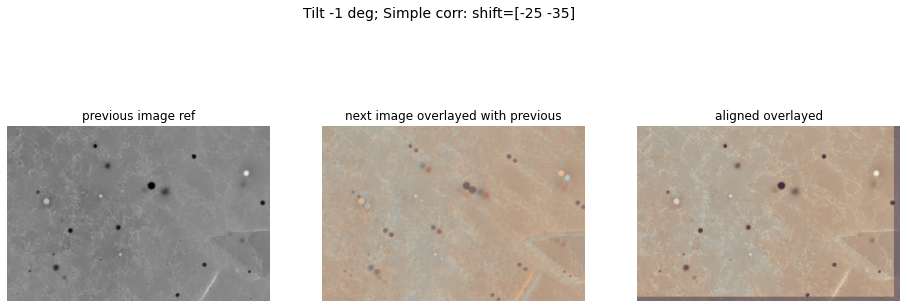

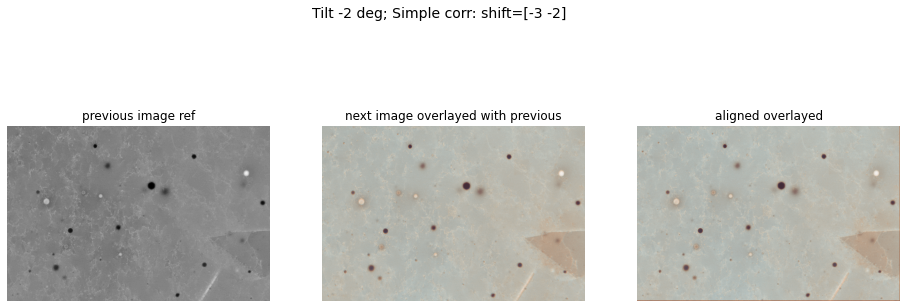

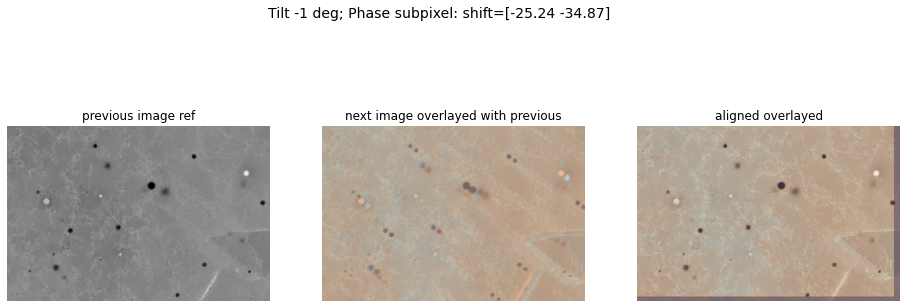

In [8]:
# Fourier filter values that worked for rotated images and z-scan images

'''
    Alignment of images
'''

low_pass = int(max(tilt_0.shape) / 6)  # =128 worked for @768x512
high_pass = int(max(tilt_0.shape) / 64)  # =12 worked for @768x512
sigma = int(max(tilt_0.shape) / 256)
print(f'lowpass = {low_pass}, highpass = {high_pass}, sigma = {sigma}')

shift, minus1_aligned = test_alignment_from_crosscorrelation(tilt_0, tilt_minus1_untilted, type='crosscorrelation',
                                                      filter='yes', low_pass=low_pass, high_pass=high_pass, sigma=3,
                                                      rect_mask=rect_mask,
                                                      plot=True,
                                                      title=f'Tilt -1 deg; Simple corr:')

shift, minus2_aligned = test_alignment_from_crosscorrelation(tilt_0, tilt_minus2_untilted, type='crosscorrelation',
                                                      filter='yes', low_pass=low_pass, high_pass=high_pass, sigma=3,
                                                      rect_mask=rect_mask,
                                                      plot=True,
                                                      title=f'Tilt -2 deg; Simple corr:')

# _, _ = test_alignment_from_crosscorrelation(tilt_0, tilt_minus1_untilted, type='phase',
#                                                       filter='yes', low_pass = low_pass, high_pass=high_pass, sigma=sigma,
#                                                       rect_mask=rect_mask,
#                                                       plot=True,
#                                                       title=f'Phase:')

# Test the upsampling correlation
_, _ = test_alignment_from_crosscorrelation(tilt_0, tilt_minus1_untilted, type='phase_subpixel',
                                                      filter='yes', low_pass = low_pass, high_pass=high_pass, sigma=sigma,
                                                      rect_mask=rect_mask,
                                                      plot=True,
                                                      title=f'Tilt -1 deg; Phase subpixel:')

In [9]:
def enhance_contrast(image, clipLimit=1.0, tileGridSize=8):
    if image.dtype=='float64' or 'uint64':
        pass
    
    # the images needs to be 8bit, otherwise the algorithm does not work TODO fix 8-bit to any-bit
    image = image / image.max()    
    image = (image * 2**8).astype('uint8')

    tileGridSize = int(tileGridSize)

    clahe = cv2.createCLAHE(clipLimit=clipLimit,
                            tileGridSize=(tileGridSize,tileGridSize))
    image = clahe.apply(image)
    return image



def equalise_histogram(image):
    try:
        _image = image.data
    except:
        _image = image

    _image = _image / _image.max()
    _image = (_image * 2**8).astype("uint8")

    _image = cv2.equalizeHist(_image)
    return _image

In [10]:
tilt_0.max(), tilt_minus1.max(), tilt_minus2.max(), tilt_0.dtype

(41711.0, 42895.0, 46531.0, dtype('float64'))

In [11]:
_type = tilt_0.dtype
_type == 'float64'

_q = tilt_0.astype("uint64")
_type = _q.dtype
print(_type)


uint64


Text(0.5, 1.0, 'Zero Tilt: enhanced clahe')

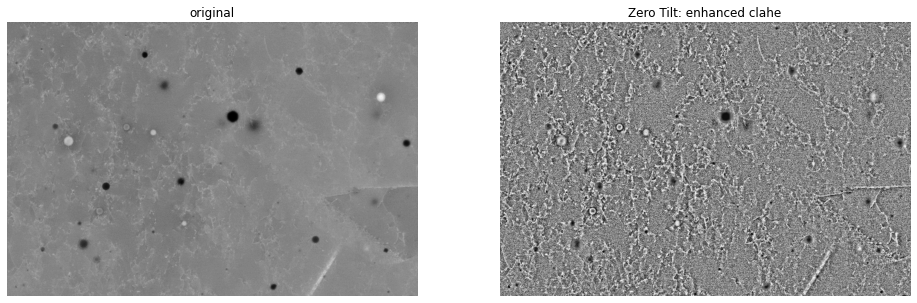

In [12]:
image = tilt_0
enhanced = enhance_contrast(image, clipLimit=15, tileGridSize=96)

fig = plt.figure(figsize=(25, 16))
ax = plt.subplot(1, 3, 1)
ax.imshow( image, cmap='gray')
ax.set_axis_off()
ax.set_title("original")

ax = plt.subplot(1, 3, 2)
ax.imshow( enhanced, cmap='gray')
ax.set_axis_off()
ax.set_title("Zero Tilt: enhanced clahe")



In [13]:
image.max(), enhanced.max()

(41711.0, 255)

Text(0.5, 1.0, 'Tilt -1 deg; enhanced clahe')

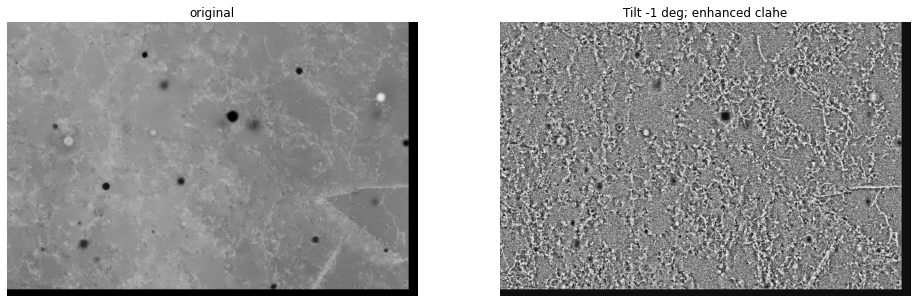

In [14]:
image = minus1_aligned
enhanced = enhance_contrast(image, clipLimit=15, tileGridSize=96)

fig = plt.figure(figsize=(25, 16))
ax = plt.subplot(1, 3, 1)
ax.imshow( image, cmap='gray')
ax.set_axis_off()
ax.set_title("original")

ax = plt.subplot(1, 3, 2)
ax.imshow( enhanced, cmap='gray')
ax.set_axis_off()
ax.set_title("Tilt -1 deg; enhanced clahe")

Text(0.5, 1.0, 'Tilt -2; enhanced clahe')

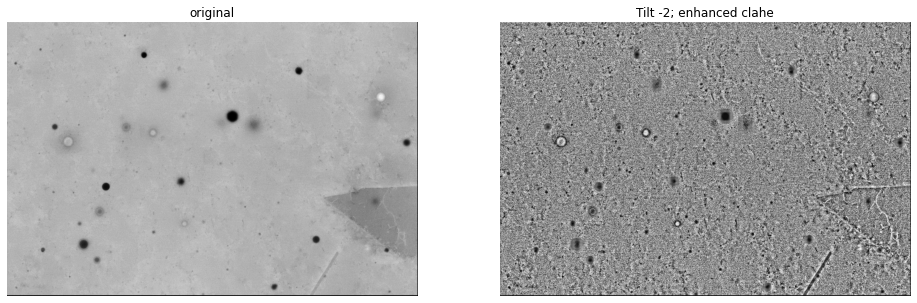

In [15]:
image = minus2_aligned
enhanced = enhance_contrast(image, clipLimit=15, tileGridSize=96)

fig = plt.figure(figsize=(25, 16))
ax = plt.subplot(1, 3, 1)
ax.imshow( image, cmap='gray')
ax.set_axis_off()
ax.set_title("original")

ax = plt.subplot(1, 3, 2)
ax.imshow( enhanced, cmap='gray')
ax.set_axis_off()
ax.set_title("Tilt -2; enhanced clahe")

# Test different CLAHE

Text(0.5, 1.0, 'skimage clahe')

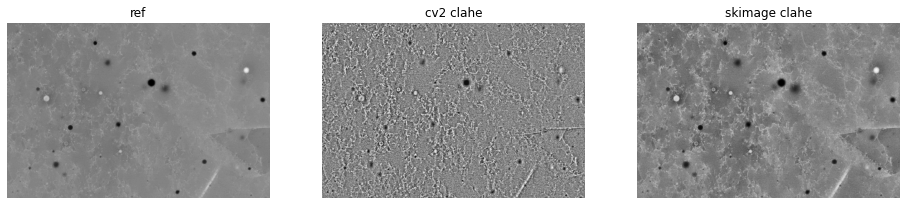

In [26]:
from skimage import exposure

image = tilt_0

enhanced_cv2 = enhance_contrast(image, clipLimit=15, tileGridSize=96)

# the images needs to be 8bit, otherwise the algorithm does not work TODO fix 8-bit to any-bit
# temp = image / image.max()    
# temp = (temp * 2**8).astype('uint8')
temp = image / image.max() 
enhanced_skimage = exposure.equalize_adapthist(temp, kernel_size=None, clip_limit=0.01, nbins=256)


fig = plt.figure(figsize=(16, 6))
ax1 = plt.subplot(1, 3, 1)
ax2 = plt.subplot(1, 3, 2, sharex=ax1, sharey=ax1)
ax3 = plt.subplot(1, 3, 3, sharex=ax2, sharey=ax2)

ax1.imshow(image, cmap='gray')
ax1.set_axis_off()
ax1.set_title('ref')

ax2.imshow(enhanced_cv2, cmap='gray')
ax2.set_axis_off()
ax2.set_title('cv2 clahe')

ax3.imshow(enhanced_skimage, cmap='gray')
ax3.set_axis_off()
ax3.set_title('skimage clahe')

In [70]:

def apply_clahe(
    image,
    which_package: str = "skimage",
    clip_limit_cv2: float = 15,
    tile_grid_size: int = 8,
    clip_limit_skimage: float = 0.02,
    kernel_size = None
):
    """
    Applies Contrast Limited Adaptive Histogram Equalisation correction to the input `FibsemImage`.
    image is divided into small blocks called "tiles" (tileSize is 8x8 by default in OpenCV). Then each of these
    blocks are histogram equalized as usual. So in a small area, histogram would confine to a small region
    (unless there is noise). If noise is there, it will be amplified. To avoid this, contrast limiting is applied.
    If any histogram bin is above the specified contrast limit (by default 40 in OpenCV), those pixels are clipped and
    distributed uniformly to other bins before applying histogram equalization. After equalization, to remove artifacts
    in tile borders, bilinear interpolation is applied.

    In OpenCV tileGridSize (tile_grid_size) is by default 8x8, clipLimit (clip_limit_cv2) is by default 40

    In skimage kernel_size (int or array_like), is optional. It defines the shape of contextual regions used in the
    algorithm. By default, kernel_size is 1/8 of image height by 1/8 of its width.
    clip_limit float, optional. Clipping limit, normalized between 0 and 1 (higher values give more contrast).

    Args:
        image (FibsemImage): The input `FibsemImage` to apply gamma correction to.

        type (str) Either "skimage" or "OpenCV" to apply the filter from the corresponding library

        clip_limit_cv2 (float): used if which_package=="OpenCV". Defaults to 15. (by default 40 in OpenCV)
        tile_grid_size (int): used if which_package=='OpenCV'. Defaults to 8x8 pixels.

        clip_limit_skimage (float): used if which_package=="skimage". Defaults to 0.01. Clipping limit, normalised between 0 and 1 (higher values give more contrast).
        tile_grid_size (int): used if which_package=='skimage'. if None, defaults to kernel_size is 1/8 of image height by 1/8 of its width.

    Returns:
        A new `FibsemImage` object containing the clahe-enhanced image data, with the same metadata
        as the input image.

    Notes:
        - This function applies gamma correction to the input image using either the `cv2.createCLAHE` or `skimage.exposure.equalize_adapthist` function
        - The `FibsemImage` object in the returned list contains the clahe-enhanced image data as a
          numpy array, as well as other image metadata.
    """

    """
        OpenCV requires 8-bit images for CLAHE, skimage requires either 8-bit images or arrays with values between [0,1]
        Here, we convert the raw data into an 8-bit image to proceed
    """

    temp = image
    temp = temp / temp.max()
    temp = (temp * 2**8).astype(np.uint8)

    if which_package=='OpenCV':
        tile_grid_size = int(tile_grid_size)
        clahe = cv2.createCLAHE(clipLimit=clip_limit_cv2,
                                tileGridSize=(tile_grid_size,tile_grid_size))
        image_data = clahe.apply(temp)

    else: # default filter
        # nbin = 256 default, for 8-bit images
        image_data = exposure.equalize_adapthist(temp,
                                                 kernel_size=kernel_size,
                                                 clip_limit=clip_limit_skimage, nbins=256)

    return image_data

Text(0.5, 1.0, 'skimage clahe')

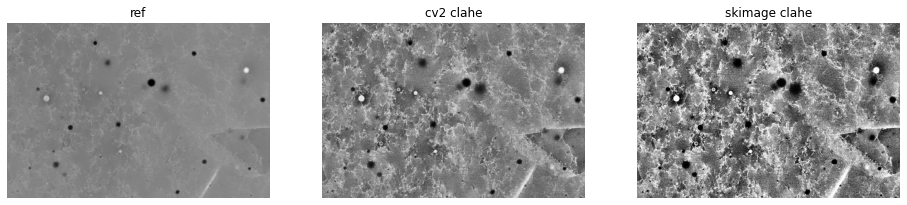

In [71]:
enhanced_1 = apply_clahe(image, which_package='skimage', clip_limit_skimage=0.02, kernel_size=None)
enhanced_2 = apply_clahe(image, which_package='OpenCV', clip_limit_cv2=40, tile_grid_size=8)

fig = plt.figure(figsize=(16, 6))
ax1 = plt.subplot(1, 3, 1)
ax2 = plt.subplot(1, 3, 2, sharex=ax1, sharey=ax1)
ax3 = plt.subplot(1, 3, 3, sharex=ax2, sharey=ax2)

ax1.imshow(image, cmap='gray')
ax1.set_axis_off()
ax1.set_title('ref')

ax2.imshow(enhanced_1, cmap='gray')
ax2.set_axis_off()
ax2.set_title('cv2 clahe')

ax3.imshow(enhanced_2, cmap='gray')
ax3.set_axis_off()
ax3.set_title('skimage clahe')

In [77]:
type(enhanced_1[0,0])

numpy.float64

In [92]:
def make_rgb_image(red, green, blue):
    chanels = [red, green, blue]
    eight_bit = []
    for chanel in chanels:
        chanel = chanel / chanel.max()    
        chanel = (chanel * 2**8).astype('uint8') 
        eight_bit.append(chanel)
    
    
    rgb = np.stack([eight_bit[0], eight_bit[1], eight_bit[2]], axis=2)
    return rgb


In [94]:
rgb = make_rgb_image(tilt_0, minus1_aligned, minus2_aligned)
print(rgb.shape)

(1024, 1536, 3)


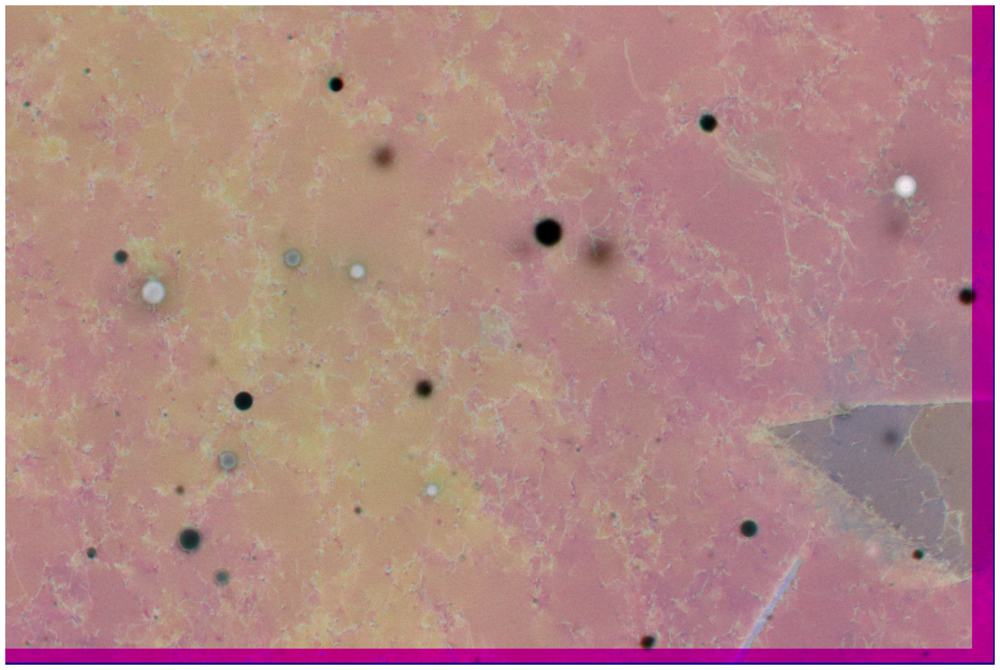

In [90]:
fig = plt.figure(figsize=(24, 16))
plt.axis("off")
#plt.imshow(rgb)
plt.imshow(cv2.cvtColor(rgb, cv2.COLOR_BGR2RGB))
plt.show()

In [91]:
im1 = Image.fromarray(rgb)
im1.show()

In [95]:
image = tilt_0
enhanced1 = enhance_contrast(image, clipLimit=15, tileGridSize=96)
image = minus1_aligned
enhanced2 = enhance_contrast(image, clipLimit=15, tileGridSize=96)
image = minus2_aligned
enhanced3 = enhance_contrast(image, clipLimit=15, tileGridSize=96)

rgb = make_rgb_image(enhanced1, enhanced2, enhanced3)
print(rgb.shape)

(1024, 1536, 3)


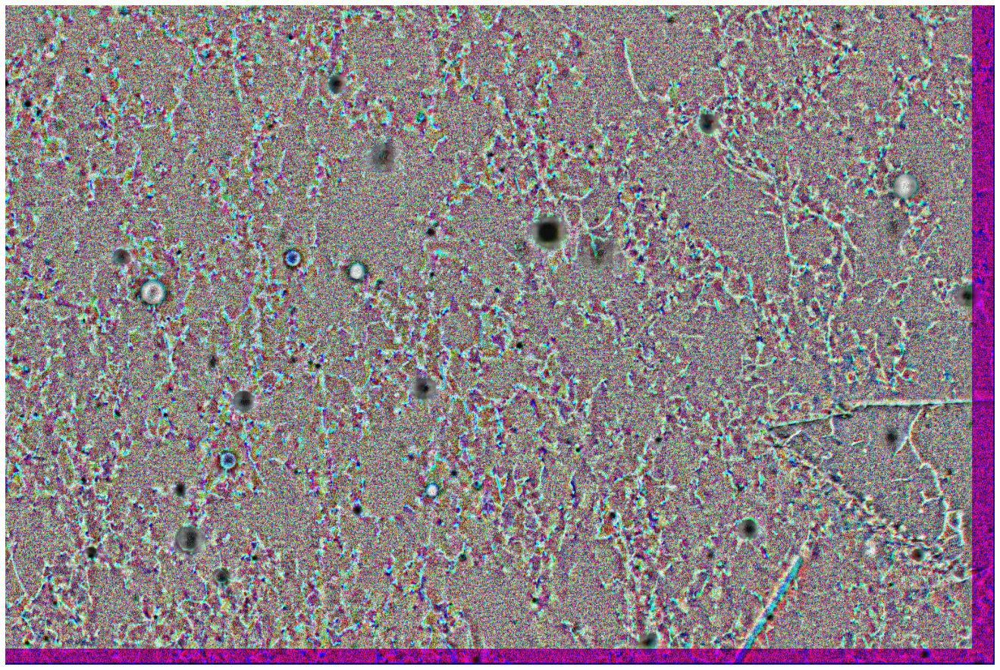

In [96]:
fig = plt.figure(figsize=(24, 16))
plt.axis("off")
#plt.imshow(rgb)
plt.imshow(cv2.cvtColor(rgb, cv2.COLOR_BGR2RGB))
plt.show()

In [97]:
im1 = Image.fromarray(rgb)
im1.show()

In [98]:
# im1 = Image.fromarray(enhanced2)
# im1.show()

In [102]:
enhanced2.max(), enhanced3.max()

(255, 255)

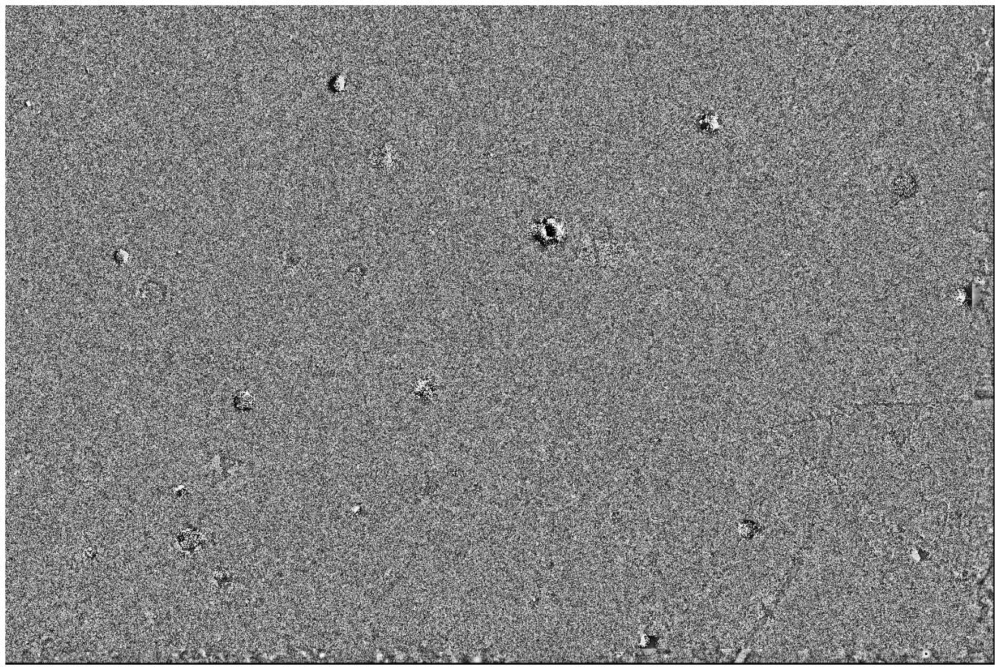

In [114]:
fig = plt.figure(figsize=(24, 16))
plt.axis("off")
plt.imshow(  (enhanced2 - enhanced3)/1, cmap='gray')
plt.show()